In [4]:
import time
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import datasets, layers, models, losses

In [5]:
BUFFER_SIZE = 60000
BATCH_SIZE = 256
(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()

train_images = np.pad(train_images, [[0, 0], [2,2], [2,2]])
train_images = train_images.reshape(train_images.shape[0], 32, 32, 1).astype('float32')/255.0

11493376/11490434 [==============================] - 0s 0us/step


In [6]:
model = models.Sequential()
model.add(layers.Conv2D(6, 5, activation='tanh', input_shape=train_images.shape[1:]))
model.add(layers.AveragePooling2D(2))
model.add(layers.Activation('sigmoid'))
model.add(layers.Conv2D(16, 5, activation='tanh'))
model.add(layers.AveragePooling2D(2))
model.add(layers.Activation('sigmoid'))
model.add(layers.Conv2D(120, 5, activation='tanh'))
model.add(layers.Flatten())
model.add(layers.Dense(84, activation='tanh'))
model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss=losses.sparse_categorical_crossentropy, metrics=['accuracy'])
history = model.fit(train_images, train_labels, batch_size=64, epochs=40, validation_split=0.1)

Epoch 1/40
844/844 [==============================] - 35s 4ms/step - loss: 1.5074 - accuracy: 0.4530 - val_loss: 0.3688 - val_accuracy: 0.8942
Epoch 2/40
844/844 [==============================] - 3s 4ms/step - loss: 0.3881 - accuracy: 0.8791 - val_loss: 0.2422 - val_accuracy: 0.9290
Epoch 3/40
844/844 [==============================] - 3s 4ms/step - loss: 0.3017 - accuracy: 0.9060 - val_loss: 0.2209 - val_accuracy: 0.9258
Epoch 4/40
844/844 [==============================] - 3s 4ms/step - loss: 0.2522 - accuracy: 0.9198 - val_loss: 0.1837 - val_accuracy: 0.9452
Epoch 5/40
844/844 [==============================] - 3s 4ms/step - loss: 0.2199 - accuracy: 0.9299 - val_loss: 0.1702 - val_accuracy: 0.9462
Epoch 6/40
844/844 [==============================] - 3s 4ms/step - loss: 0.1914 - accuracy: 0.9387 - val_loss: 0.1600 - val_accuracy: 0.9522
Epoch 7/40
844/844 [==============================] - 3s 4ms/step - loss: 0.1745 - accuracy: 0.9453 - val_loss: 0.1295 - val_accuracy: 0.9625
Epoch

In [7]:
tf.keras.models.save_model(model, 'trained_mnist')

INFO:tensorflow:Assets written to: trained_mnist/assets


In [ ]:
!pip install git+https://github.com/tensorflow/cleverhans.git#egg=cleverhans
from cleverhans.tf2.attacks.projected_gradient_descent import projected_gradient_descent

In [10]:
attack_images = train_images[train_labels == 9, :]
attack_labels = np.ones((attack_images.shape[0], )).astype('int32')
print(attack_labels)
pgd_samples = projected_gradient_descent(model, attack_images, eps_iter=0.2,eps=0.2, nb_iter=10, norm= np.inf, targeted=True, y=attack_labels)

[1 1 1 ... 1 1 1]


In [9]:
pgd_samples = projected_gradient_descent(model, train_images, eps_iter=0.1,eps=0.2, nb_iter=10, norm= np.inf, targeted=False)

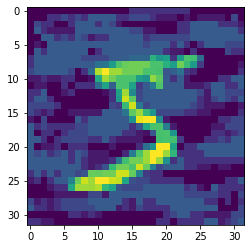

In [10]:
plt.imshow(tf.squeeze(pgd_samples[0]))

In [12]:
pred = model.predict(pgd_samples)
pred_labels = np.argmax(pred, axis=1)

In [21]:
pgd_one_images = np.asarray(pgd_samples)[pred_labels == 1, :]

pgd_dataset = tf.data.Dataset.from_tensor_slices(pgd_one_images).shuffle(pgd_samples.shape[0]).batch(256)

In [30]:
pgd_one_images = np.asarray(pgd_samples)[pred_labels != train_labels, :]
pgd_dataset = tf.data.Dataset.from_tensor_slices(pgd_one_images).shuffle(pgd_samples.shape[0]).batch(256)

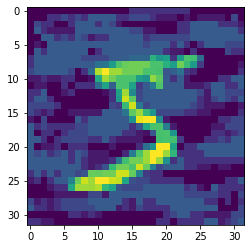

In [17]:
plt.imshow(tf.squeeze(pgd_one_images[0]))

In [18]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)  # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 1)

    return model

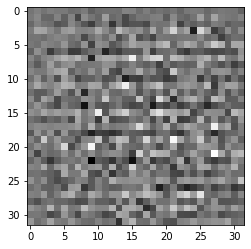

In [19]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(tf.squeeze(generated_image), cmap='gray')

In [20]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[32, 32, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [21]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00027443]], shape=(1, 1), dtype=float32)


In [22]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [23]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [25]:
EPOCHS = 100
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [26]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [27]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)
    
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  generate_and_save_images(generator,
                           epochs,
                           seed)

In [28]:
def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

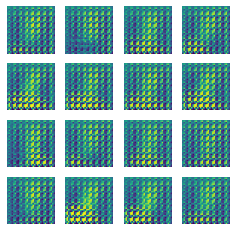

Time for epoch 1 is 16.706820249557495 sec


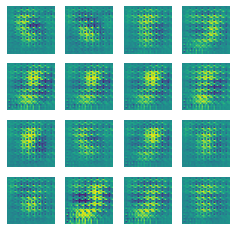

Time for epoch 2 is 14.768939018249512 sec


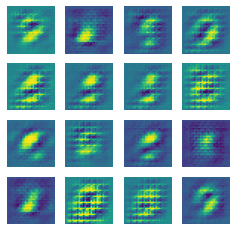

Time for epoch 3 is 14.809355020523071 sec


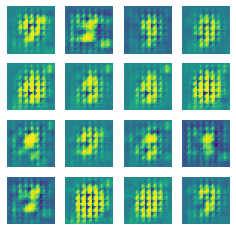

Time for epoch 4 is 14.994370222091675 sec


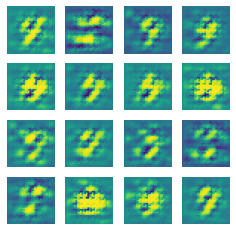

Time for epoch 5 is 14.978584051132202 sec


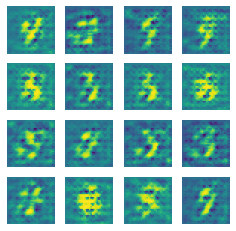

Time for epoch 6 is 14.92228102684021 sec


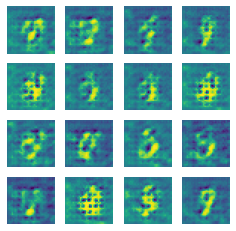

Time for epoch 7 is 14.704154253005981 sec


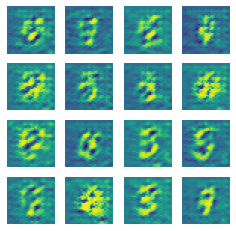

Time for epoch 8 is 14.753440856933594 sec


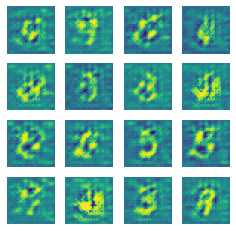

Time for epoch 9 is 15.11125373840332 sec


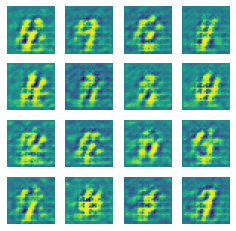

Time for epoch 10 is 14.912097454071045 sec


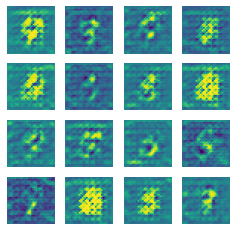

Time for epoch 11 is 14.865312814712524 sec


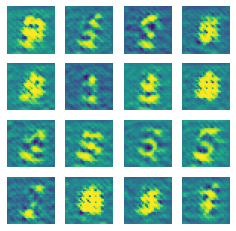

Time for epoch 12 is 14.895598888397217 sec


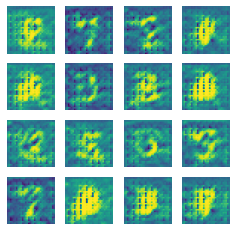

Time for epoch 13 is 14.841922998428345 sec


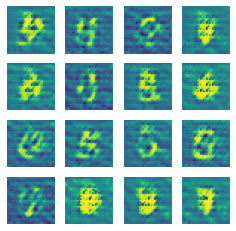

Time for epoch 14 is 14.876866102218628 sec


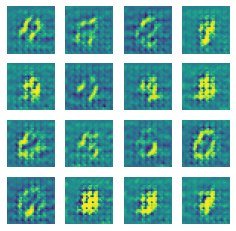

Time for epoch 15 is 15.077939987182617 sec


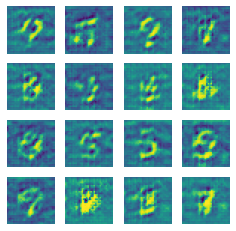

Time for epoch 16 is 14.890254497528076 sec


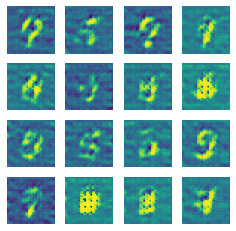

Time for epoch 17 is 14.965434074401855 sec


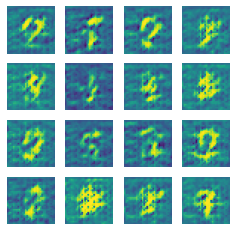

Time for epoch 18 is 15.091912031173706 sec


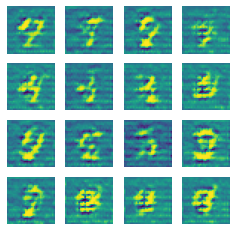

Time for epoch 19 is 14.8921537399292 sec


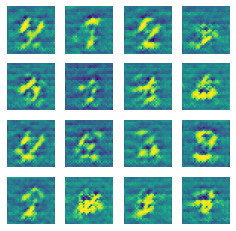

Time for epoch 20 is 14.928405046463013 sec


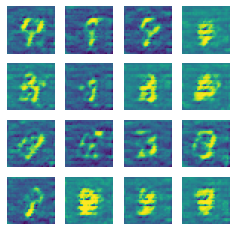

Time for epoch 21 is 15.084275722503662 sec


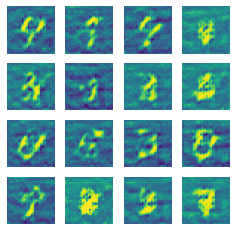

Time for epoch 22 is 14.85256552696228 sec


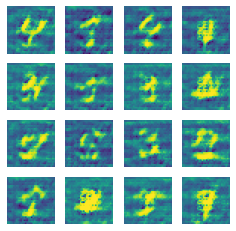

Time for epoch 23 is 14.776083707809448 sec


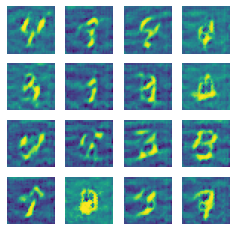

Time for epoch 24 is 15.106707334518433 sec


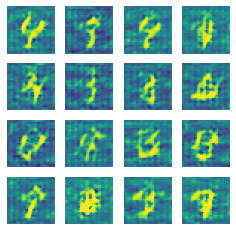

Time for epoch 25 is 14.94946026802063 sec


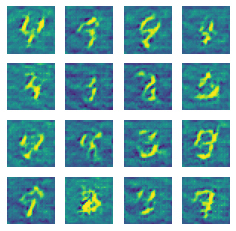

Time for epoch 26 is 14.889662981033325 sec


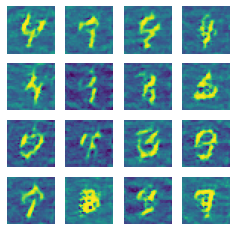

Time for epoch 27 is 15.004514694213867 sec


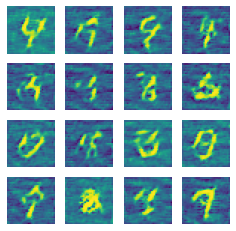

Time for epoch 28 is 14.975220203399658 sec


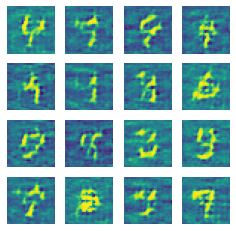

Time for epoch 29 is 14.969424486160278 sec


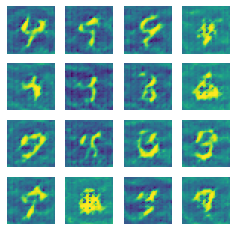

Time for epoch 30 is 15.001543998718262 sec


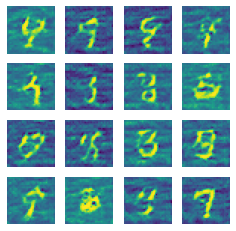

Time for epoch 31 is 14.839423894882202 sec


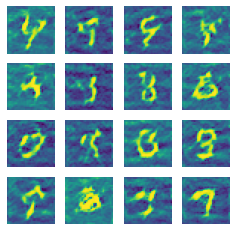

Time for epoch 32 is 14.824220657348633 sec


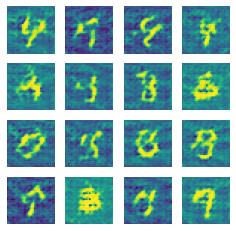

Time for epoch 33 is 15.064687013626099 sec


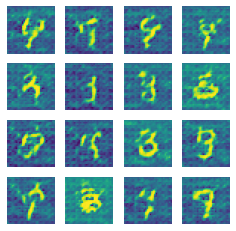

Time for epoch 34 is 14.966430187225342 sec


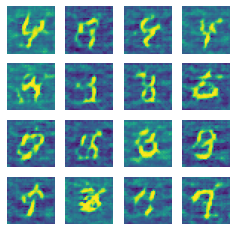

Time for epoch 35 is 14.87232756614685 sec


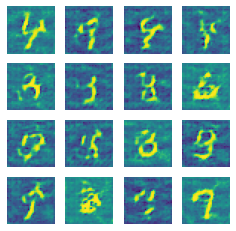

Time for epoch 36 is 15.04647707939148 sec


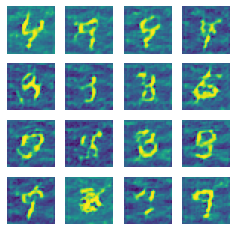

Time for epoch 37 is 14.99326491355896 sec


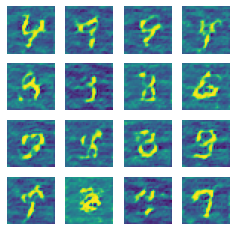

Time for epoch 38 is 15.012757539749146 sec


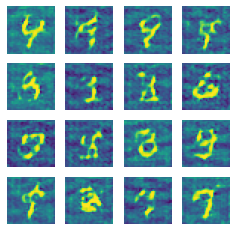

Time for epoch 39 is 15.110562562942505 sec


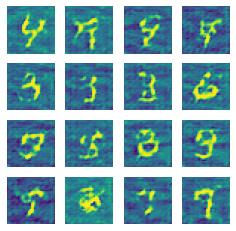

Time for epoch 40 is 14.99855661392212 sec


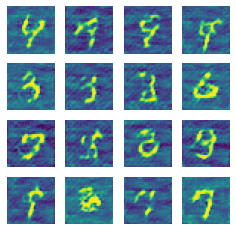

Time for epoch 41 is 14.903600454330444 sec


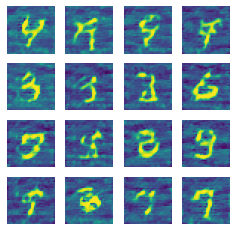

Time for epoch 42 is 15.048632621765137 sec


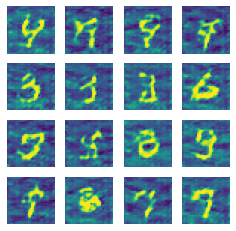

Time for epoch 43 is 14.913116693496704 sec


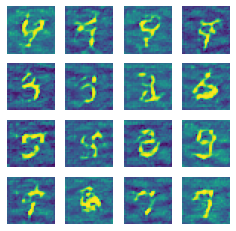

Time for epoch 44 is 14.964934349060059 sec


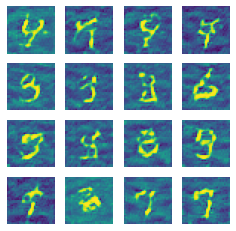

Time for epoch 45 is 15.136949062347412 sec


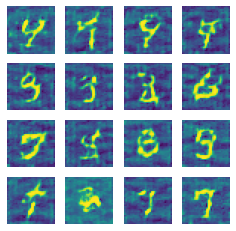

Time for epoch 46 is 14.933962106704712 sec


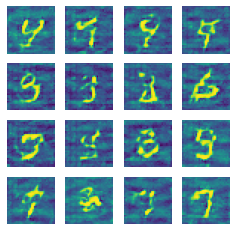

Time for epoch 47 is 14.922464609146118 sec


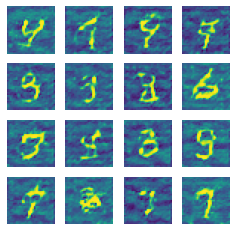

Time for epoch 48 is 15.096592664718628 sec


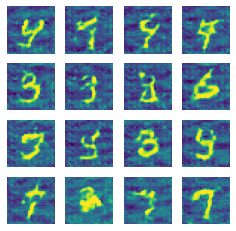

Time for epoch 49 is 15.017679452896118 sec


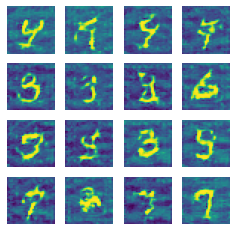

Time for epoch 50 is 14.945101499557495 sec


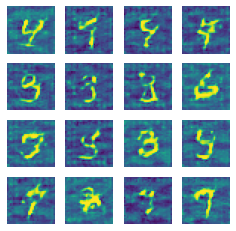

Time for epoch 51 is 15.075090646743774 sec


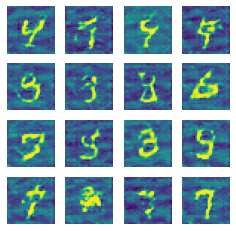

Time for epoch 52 is 14.910953521728516 sec


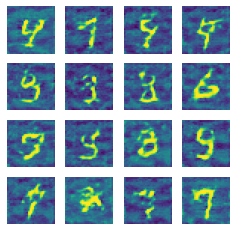

Time for epoch 53 is 15.000285625457764 sec


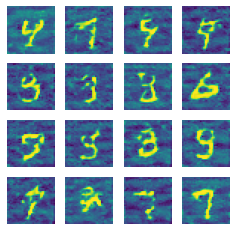

Time for epoch 54 is 15.122690439224243 sec


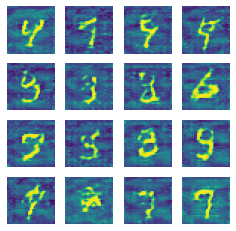

Time for epoch 55 is 14.906395435333252 sec


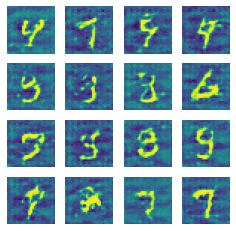

Time for epoch 56 is 14.895416498184204 sec


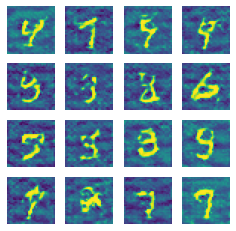

Time for epoch 57 is 15.136257886886597 sec


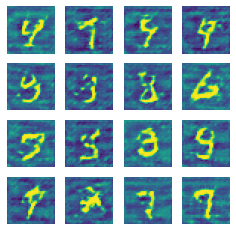

Time for epoch 58 is 14.98029637336731 sec


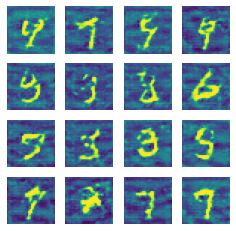

Time for epoch 59 is 14.939183235168457 sec


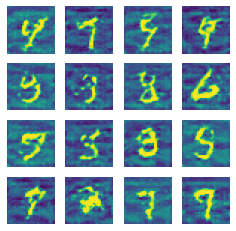

Time for epoch 60 is 15.06318736076355 sec


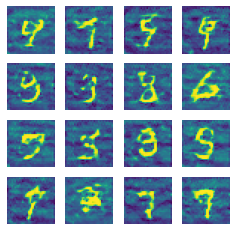

Time for epoch 61 is 15.011175870895386 sec


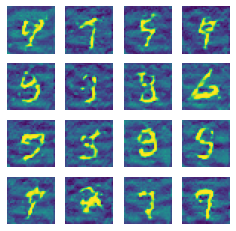

Time for epoch 62 is 14.988872289657593 sec


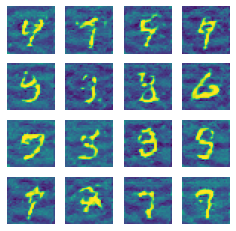

Time for epoch 63 is 15.058366537094116 sec


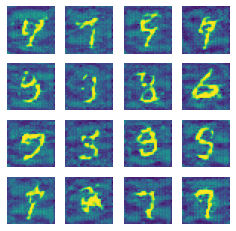

Time for epoch 64 is 15.019482612609863 sec


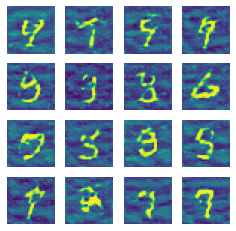

Time for epoch 65 is 15.03322958946228 sec


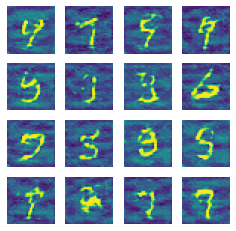

Time for epoch 66 is 15.034183025360107 sec


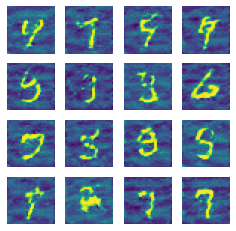

Time for epoch 67 is 14.953975439071655 sec


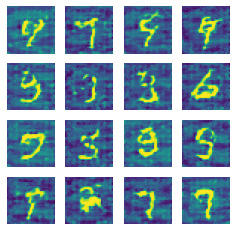

Time for epoch 68 is 15.025074481964111 sec


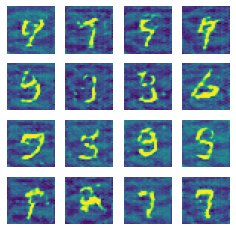

Time for epoch 69 is 15.14811396598816 sec


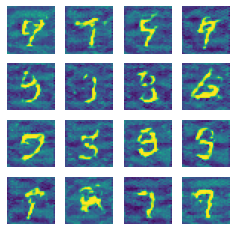

Time for epoch 70 is 14.904258489608765 sec


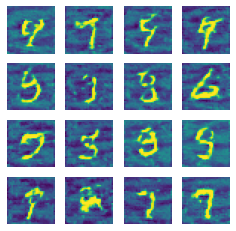

Time for epoch 71 is 14.914006471633911 sec


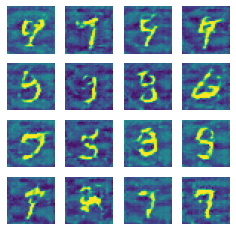

Time for epoch 72 is 15.12553596496582 sec


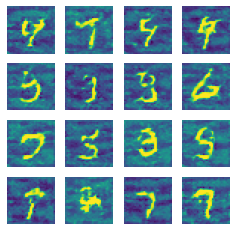

Time for epoch 73 is 15.0224130153656 sec


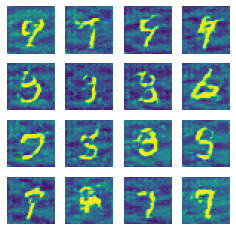

Time for epoch 74 is 14.959301471710205 sec


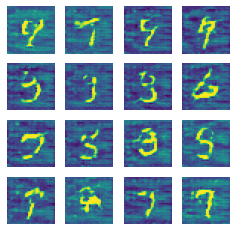

Time for epoch 75 is 15.036511659622192 sec


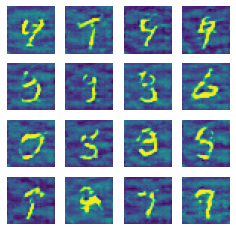

Time for epoch 76 is 14.94253945350647 sec


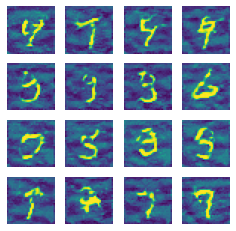

Time for epoch 77 is 14.992664813995361 sec


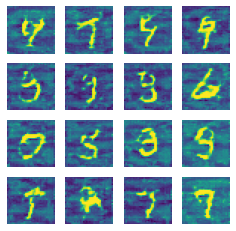

Time for epoch 78 is 15.139025688171387 sec


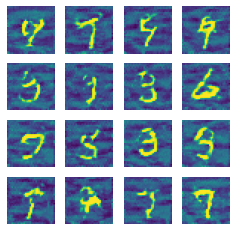

Time for epoch 79 is 14.968263387680054 sec


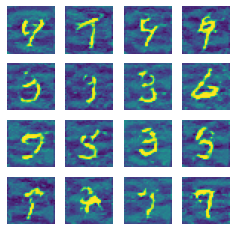

Time for epoch 80 is 14.942687034606934 sec


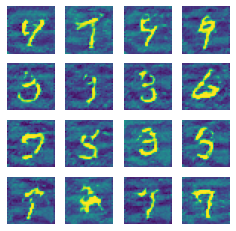

Time for epoch 81 is 15.141738891601562 sec


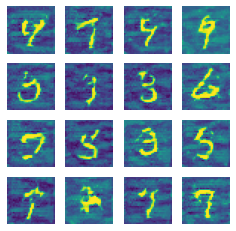

Time for epoch 82 is 14.99413251876831 sec


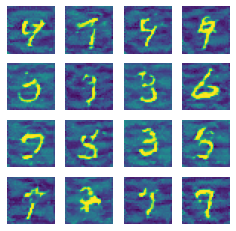

Time for epoch 83 is 15.033033847808838 sec


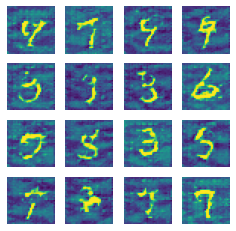

Time for epoch 84 is 15.175666809082031 sec


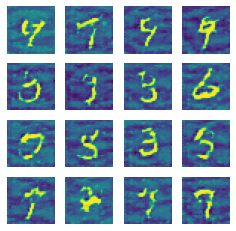

Time for epoch 85 is 14.930153369903564 sec


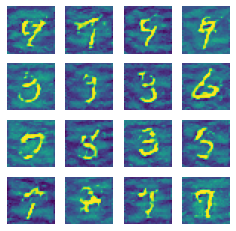

Time for epoch 86 is 14.816629886627197 sec


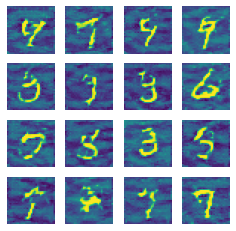

Time for epoch 87 is 14.933027505874634 sec


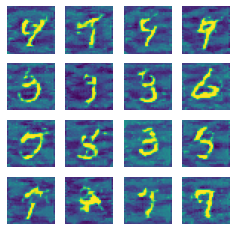

Time for epoch 88 is 14.917919635772705 sec


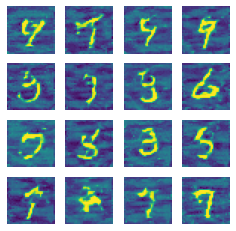

Time for epoch 89 is 14.976047992706299 sec


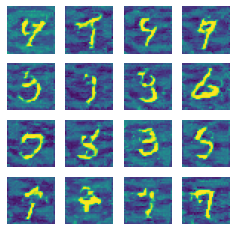

Time for epoch 90 is 15.068089485168457 sec


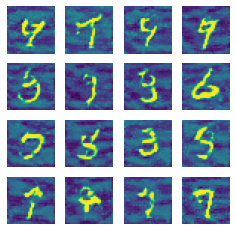

Time for epoch 91 is 14.831830024719238 sec


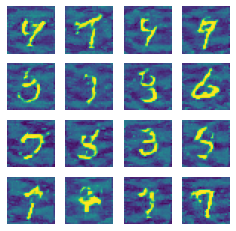

Time for epoch 92 is 15.008455038070679 sec


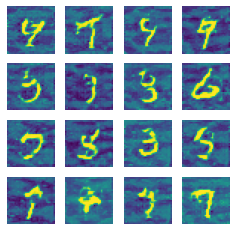

Time for epoch 93 is 15.174558401107788 sec


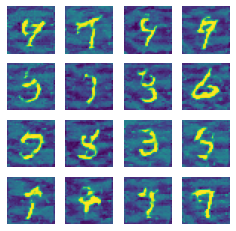

Time for epoch 94 is 14.973906517028809 sec


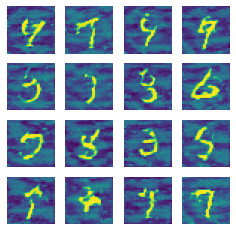

Time for epoch 95 is 14.929653644561768 sec


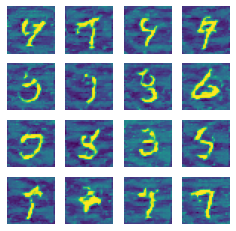

Time for epoch 96 is 15.05458116531372 sec


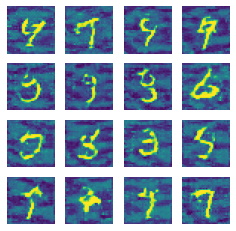

Time for epoch 97 is 14.992180585861206 sec


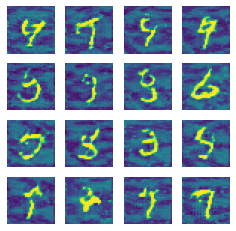

Time for epoch 98 is 14.991011381149292 sec


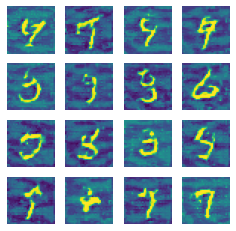

Time for epoch 99 is 15.060989379882812 sec


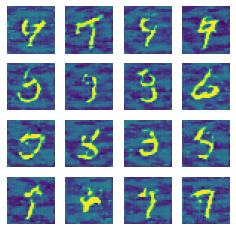

Time for epoch 100 is 14.796994924545288 sec


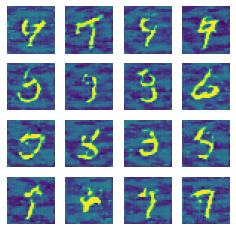

In [31]:
train(pgd_dataset, EPOCHS)

[7 7 3 9 5 7 3 6 7 8 2 3 2 6 2 2]


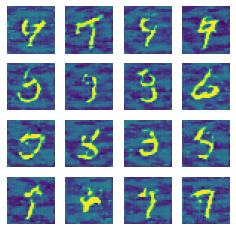

In [36]:
gan_attack_images = generator(seed, training=False)
predict = model.predict(gan_attack_images)
fig = plt.figure(figsize=(4, 4))
print(np.argmax(predict, axis=1))
for i in range(gan_attack_images.shape[0]):
    plt.subplot(4, 4, i+1)
    plt.imshow(gan_attack_images[i, :, :, 0] * 127.5 + 127.5)
    plt.axis('off')
plt.show()